In [1]:
import numpy as np 
import pandas as pd 
import matplotlib as mpl
import matplotlib.pyplot as plt 
import missingno as msno
import seaborn as sns 
import os

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import classification_report, accuracy_score

In [2]:
import matplotlib_inline.backend_inline

matplotlib_inline.backend_inline.set_matplotlib_formats("png2x")
# 테마 설정: "default", "classic", "dark_background", "fivethirtyeight", "seaborn"
mpl.style.use("fivethirtyeight")
# 이미지가 레이아웃 안으로 들어오도록 함
mpl.rcParams.update({"figure.constrained_layout.use": True})

In [3]:
import matplotlib.font_manager as fm
font_list = fm.findSystemFonts(fontpaths=None, fontext='ttf')
[fm.FontProperties(fname=font).get_name() for font in font_list if 'D2C' in font]
plt.rc('font', family='D2Coding')
mpl.rcParams['axes.unicode_minus'] = False

In [4]:
import re

def choose_split_point(word_len,space,ths):
    # 윗 줄에 space 만큼 공백이 있고, 한 줄의 길이가 ths로 제한 되어있을 때
    # 어떤 지점에서 단어를 끊어줄지 정하기
    # |-------ths-------|
    # |-space-|---------|-space-|------| : word
    #         |-------ths-------|
    print(word_len,space,ths)
    if word_len < ths + space :
        if abs(word_len/2 -ths) <= abs(word_len/2-space) :
            return word_len-ths
        else :
            return word_len - space if word_len < 2 * space else space
    else :
        return ths if word_len - (ths + space) < 0.3 * ths else space

def minimize_seq_idx_np(domain:np.array,func):
    vfunc = np.vectorize(func)
    temp = np.argsort(vfunc(domain))
    return temp[0]

def modify_strlen_ths(last,new,ths=16):
    front = len(last)
    space = ths - (1+front)
    if len(new) < space :
        rslt = [last + ' ' + new]
    else :
        if len(new) < ths:
            rslt = [last, new]
        else:
            cut = choose_split_point(len(new),space-1,ths-1)
            new_h, new_e = new[:cut]+'-', new[cut:]
            if cut < ths-1 :
                rslt = modify_strlen_ths(last+' '+new_h,new_e)
            else :
                rslt = [last] + modify_strlen_ths(new_h,new_e) 
    return rslt

def str_cutter(sentnc, ths = 16):
    words= sentnc.split(' ')
    rslt, pnt = [''], 0
    while pnt < len(words):
        last = '' if len(rslt)==0 else rslt[-1]
        next_ele = modify_strlen_ths(last,words[pnt],ths)
        rslt = rslt[:-1] + next_ele
        pnt += 1
    return '\n'.join(rslt)[1:]
#알고리즘 때문에 맨 앞에 빈칸 하나 들어가게 되는 이슈 있음

print(str_cutter('Racial Segregation Indices | Racial Segregation, White and Hispanic', 13))



Racial
Segregation
Indices |
Racial
Segregation,
White and
Hispanic


In [5]:
DATASET_DIR = '/home/doeun/code/AI/ESTSOFT2024/workspace/dataset/'
load_dir = 'america_big_cities_health_inventory'
file_name = 'BigCitiesHealth.csv'
RSLT_DIR = '/home/doeun/code/AI/ESTSOFT2024/workspace/1.project1_structured/BCHI/processed/'
pvtb_dir = RSLT_DIR + 'pvtb/'

In [6]:
file_path = os.path.join(DATASET_DIR,load_dir,file_name)
df = pd.read_csv(file_path)

df.info()

/tmp/ipykernel_195620/4197090996.py:2: DtypeWarning: Columns (30) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file_path)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 189979 entries, 0 to 189978
Data columns (total 31 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   metric_item_label                189979 non-null  object 
 1   metric_cat_label                 189979 non-null  object 
 2   metric_subcat_label              189979 non-null  object 
 3   metric_item_label_subtitle       189979 non-null  object 
 4   metric_cat_item_yaxis_label      189979 non-null  object 
 5   metric_source_desc_label_fn      189979 non-null  object 
 6   metric_source_desc_label_url_fn  189979 non-null  object 
 7   geo_label_city                   189979 non-null  object 
 8   geo_label_state                  188667 non-null  object 
 9   geo_label_citystate              189979 non-null  object 
 10  geo_fips_code                    188667 non-null  float64
 11  value                            189979 non-null  float64
 12  da

In [7]:
df["metric_label"] = df["metric_subcat_label"]+' | '+df["metric_item_label"] 

In [8]:
df["metric_label"].value_counts()

metric_label
Deaths | Premature Death                                  6825
Deaths | Injury Deaths                                    6405
Deaths | Deaths from All Causes                           6244
Cancer | All Cancer Deaths                                6233
Cardiovascular Disease | Cardiovascular Disease Deaths    6195
                                                          ... 
Housing | Homeless, Total                                  266
Housing | Vacant Housing and Homelessness                  266
Housing | Homeless, Children                               256
Respiratory Infection | COVID-19 Vaccination, Adults        70
Respiratory Infection | COVID-19 Vaccination, Seniors       70
Name: count, Length: 118, dtype: int64

### U.S. Total 제외

In [9]:
df_city = df[df['geo_label_city']!='U.S. Total']

df_city.info()

<class 'pandas.core.frame.DataFrame'>
Index: 188667 entries, 0 to 189978
Data columns (total 32 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   metric_item_label                188667 non-null  object 
 1   metric_cat_label                 188667 non-null  object 
 2   metric_subcat_label              188667 non-null  object 
 3   metric_item_label_subtitle       188667 non-null  object 
 4   metric_cat_item_yaxis_label      188667 non-null  object 
 5   metric_source_desc_label_fn      188667 non-null  object 
 6   metric_source_desc_label_url_fn  188667 non-null  object 
 7   geo_label_city                   188667 non-null  object 
 8   geo_label_state                  188667 non-null  object 
 9   geo_label_citystate              188667 non-null  object 
 10  geo_fips_code                    188667 non-null  float64
 11  value                            188667 non-null  float64
 12  date_la

In [10]:
## x축을 metric_item_label로, 너무 많으니까 좀 줄여서.

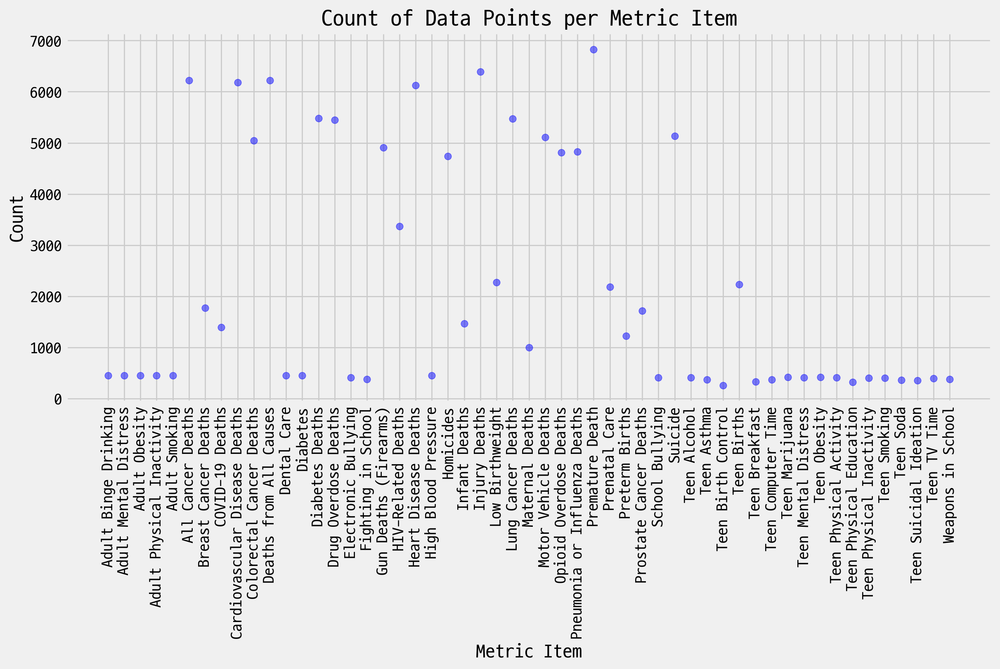

In [11]:
# 결측치가 60% 이상인 컬럼을 제거
threshold = 0.6
df_cleaned = df_city.loc[:, df_city.isnull().mean() < threshold]

# 데이터프레임의 수치형 컬럼 선택
numerical_columns = df_cleaned.select_dtypes(include='number').columns

# 결측치가 있는 행을 삭제
df_cleaned = df_cleaned.dropna(subset=numerical_columns)

# 'metric_item_label' 컬럼을 기준으로 데이터를 정렬하고 그룹화
sorted_data_by_metric = df_cleaned.sort_values(by='metric_item_label')
grouped_data_by_metric = sorted_data_by_metric.groupby('metric_item_label')

# 각 그룹의 데이터 포인트 수 계산
counts = grouped_data_by_metric.size()

# 데이터 포인트 수를 산점도로 시각화
plt.figure(figsize=(12, 8))
plt.scatter(counts.index, counts.values, alpha=0.5, color='blue')
plt.xlabel('Metric Item')
plt.ylabel('Count')
plt.title('Count of Data Points per Metric Item')
plt.xticks(rotation=90)
plt.show()

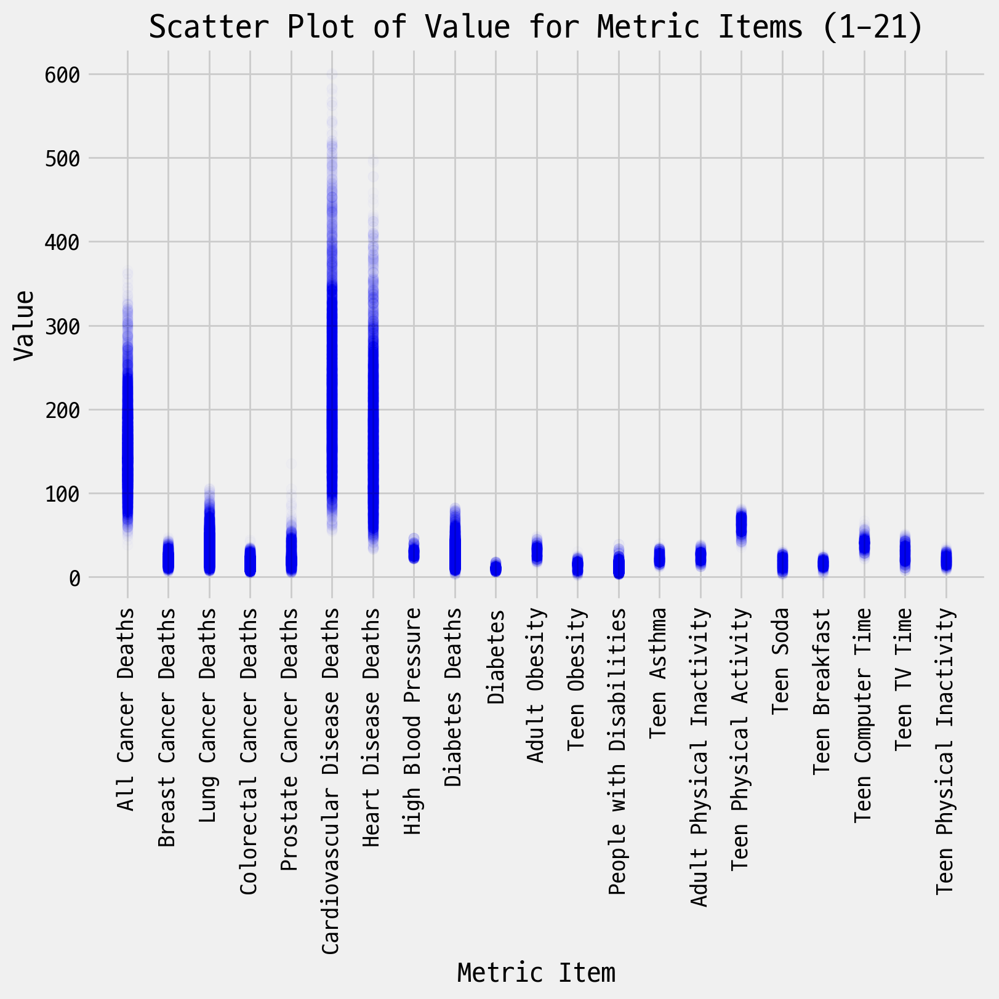

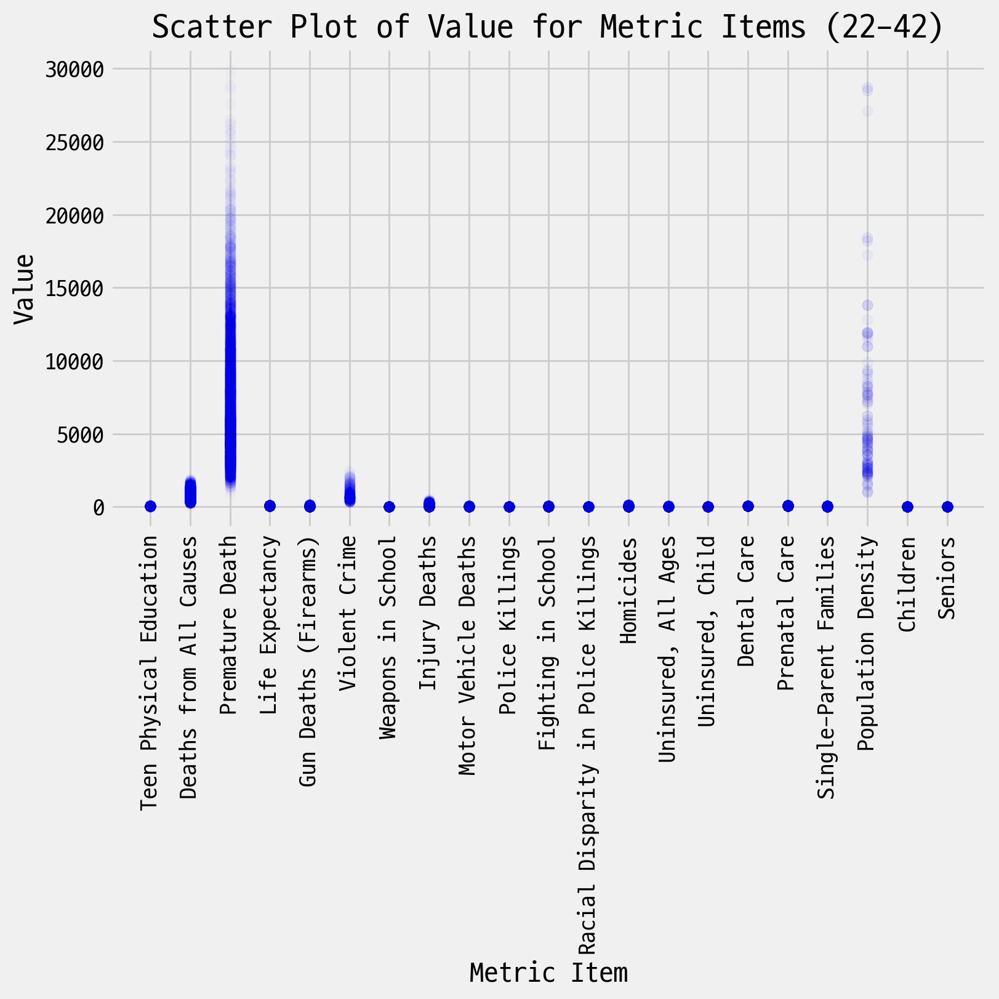

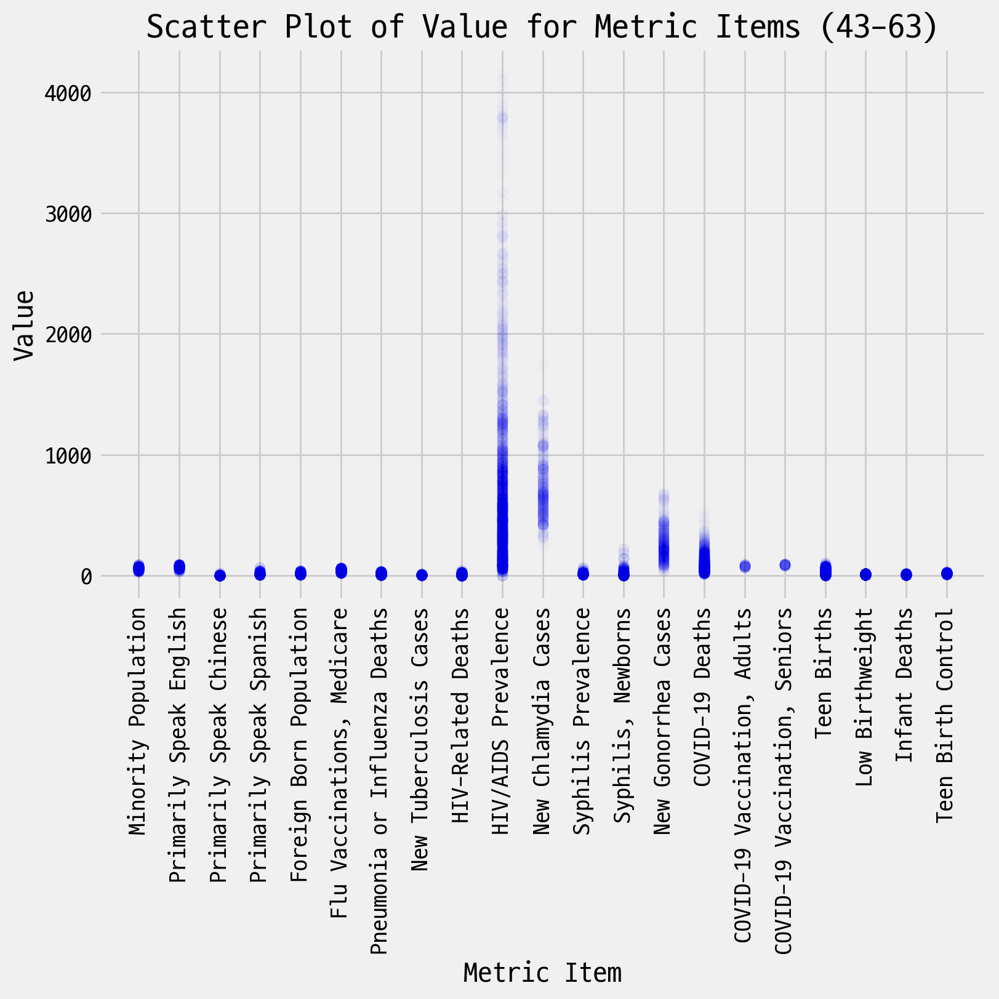

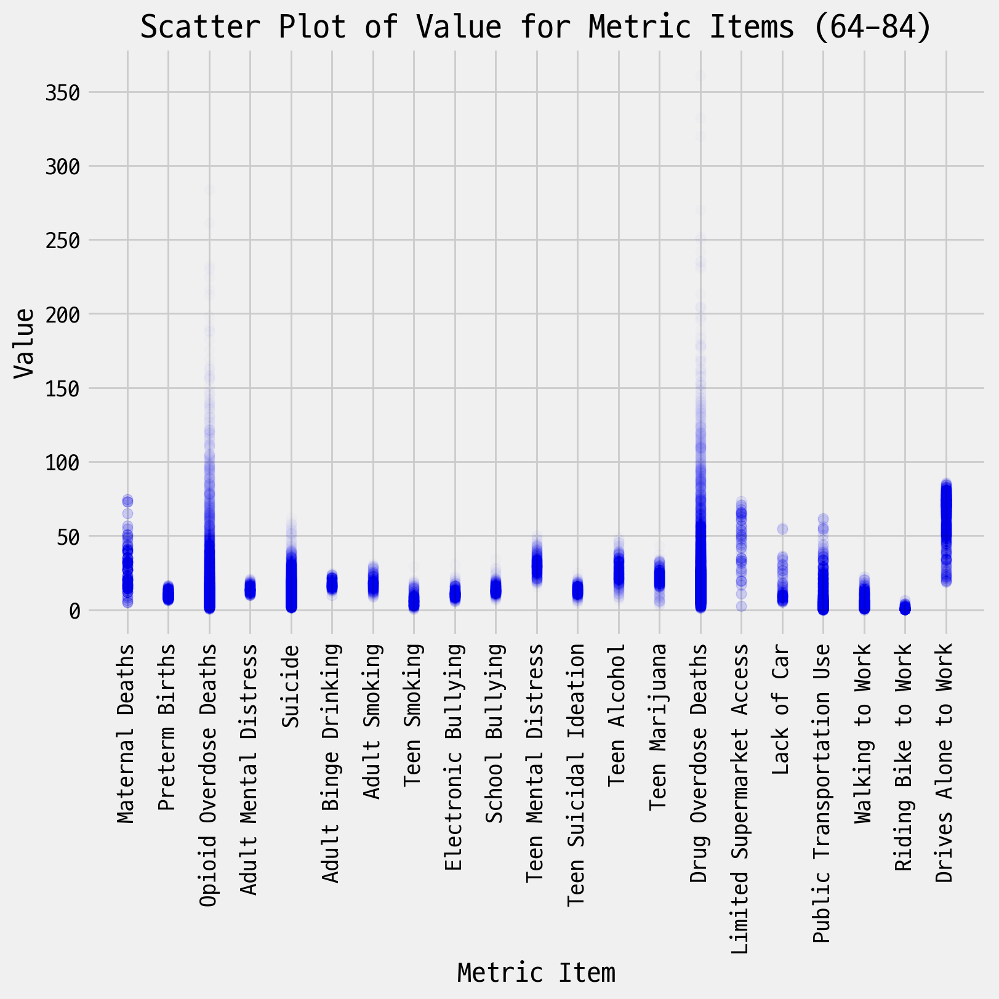

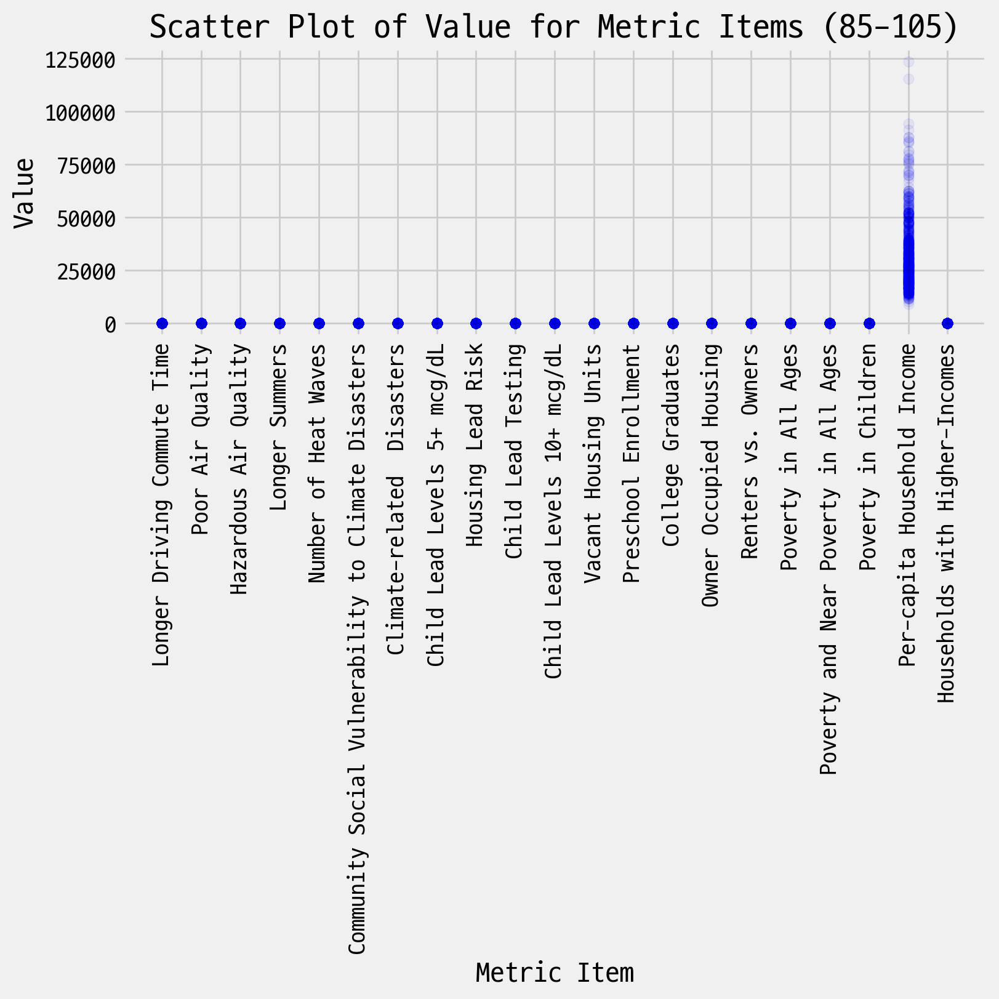

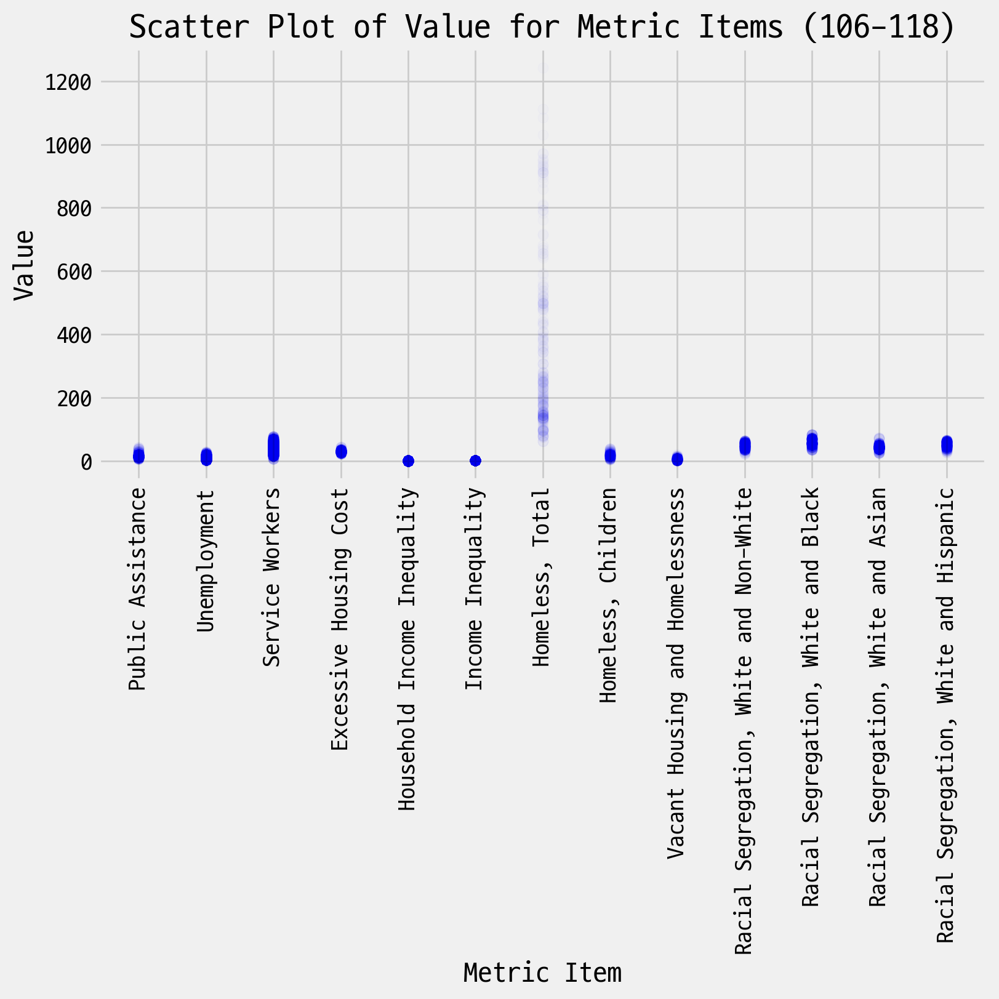

In [12]:
# 결측치가 60% 이상인 컬럼을 제거
threshold = 0.6
df_cleaned = df.loc[:, df.isnull().mean() < threshold]

# 데이터프레임의 수치형 컬럼 선택
numerical_columns = df_cleaned.select_dtypes(include='number').columns

# 결측치가 있는 행을 삭제
#df_cleaned = df_cleaned.dropna(subset=[value_column])

# metric_item_label의 고유한 값들
unique_metric_items = df_cleaned['metric_item_label'].unique()

# 고유한 값들을 21개씩 끊어서 시각화
for i in range(0, len(unique_metric_items), 21):
    chunk = unique_metric_items[i:i+21]
    chunk_data = df_cleaned[df_cleaned['metric_item_label'].isin(chunk)]
    
    plt.figure(figsize=(8, 8))
    plt.scatter(chunk_data['metric_item_label'], chunk_data['value'], alpha=0.01, color='blue')
    plt.xlabel('Metric Item')
    plt.ylabel('Value')
    plt.title(f'Scatter Plot of Value for Metric Items ({i+1}-{min(i+21, len(unique_metric_items))})')
    plt.xticks(rotation=90)
    plt.show()

In [13]:
df_check_missing = df[['metric_item_label','value']]
label_filled_ratio = pd.pivot_table(df_check_missing,index='metric_item_label',aggfunc=len)
label_filled_ratio['ratio'] =label_filled_ratio['value']/7280*100
label_filled_ratio.sort_values(by=['value'],ascending=False)


,value,ratio
metric_item_label,,
Premature Death,6825,93.750000
Injury Deaths,6405,87.980769
Deaths from All Causes,6244,85.769231
All Cancer Deaths,6233,85.618132
Cardiovascular Disease Deaths,6195,85.096154
...,...,...
Vacant Housing and Homelessness,266,3.653846
"Homeless, Total",266,3.653846
"Homeless, Children",256,3.516484


In [14]:
cond = df['metric_item_label'] == 'Injury Deaths'
cond1 = df['geo_label_city'] == 'U.S. Total'
df_injury = df[cond&(~cond1)]
len(df_injury)

6392

#### 'metric_cat_item_yaxis_label' 컬럼을 기준으로 라벨을 분류 

In [15]:
# 'metric_cat_item_yaxis_label' 컬럼을 기준으로 데이터를 정렬
sorted_data_by_metric = df.sort_values(by='metric_cat_item_yaxis_label')

# 정렬된 데이터를 'metric_cat_item_yaxis_label' 컬럼의 요소별로 그룹화
grouped_by_unit = sorted_data_by_metric.groupby(by='metric_cat_item_yaxis_label')['metric_label'].apply(set)
print(len(grouped_by_unit))
grouped_by_unit

19


metric_cat_item_yaxis_label
Cases per 100,000                               {Sexually Transmitted Disease | New Chlamydia ...
Cases per 100,000 live births                   {Sexually Transmitted Disease | Syphilis, Newb...
Days                                            {Heat and Disasters | Climate-related  Disaste...
Dollars                                                    {Income | Per-capita Household Income}
Incidents per 100,000                           {Crime Incidents | Violent Crime, Crime Incide...
Lower is better                                 {Racial Segregation Indices | Racial Segregati...
Number                                                {Heat and Disasters | Number of Heat Waves}
Per 1,000                                                                {Deaths | Infant Deaths}
Per 1,000 females aged 15-19                                               {Births | Teen Births}
Per 1,000,000                                   {Deaths | Racial Disparity in Police Killi

In [55]:
len(grouped_by_unit)

19

In [17]:
grouped_by_unit.apply(len)

metric_cat_item_yaxis_label
Cases per 100,000                                5
Cases per 100,000 live births                    1
Days                                             2
Dollars                                          1
Incidents per 100,000                            2
Lower is better                                  6
Number                                           1
Per 1,000                                        1
Per 1,000 females aged 15-19                     1
Per 1,000,000                                    2
Per 100,000                                     17
Per 100,000 females                              1
Per 100,000 males                                1
Percent                                         72
Persons per square mile                          1
Ratio                                            1
Vacant housing units per homeless population     1
Years                                            1
Years per 100,000 population aged <75            1
Nam

In [18]:
np.sum(grouped_by_unit.apply(len))

118

/tmp/ipykernel_195620/1516081844.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(map(lambda x: str_cutter(x,22),old_label),ha = 'center')
/tmp/ipykernel_195620/1516081844.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(map(lambda x: str_cutter(x,22),old_label),ha = 'center')
/tmp/ipykernel_195620/1516081844.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(map(lambda x: str_cutter(x,22),old_label),ha = 'center')
/tmp/ipykernel_195620/1516081844.py:19: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(new_label, ha = 'right', rotation = 90)
/tmp/ipykernel_195620/1516081844.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(map(lambda x: str_cutter(x,22),old_label),ha = 'center')
/tmp/ipykernel_195620/1516081844.py:19: UserWarning:

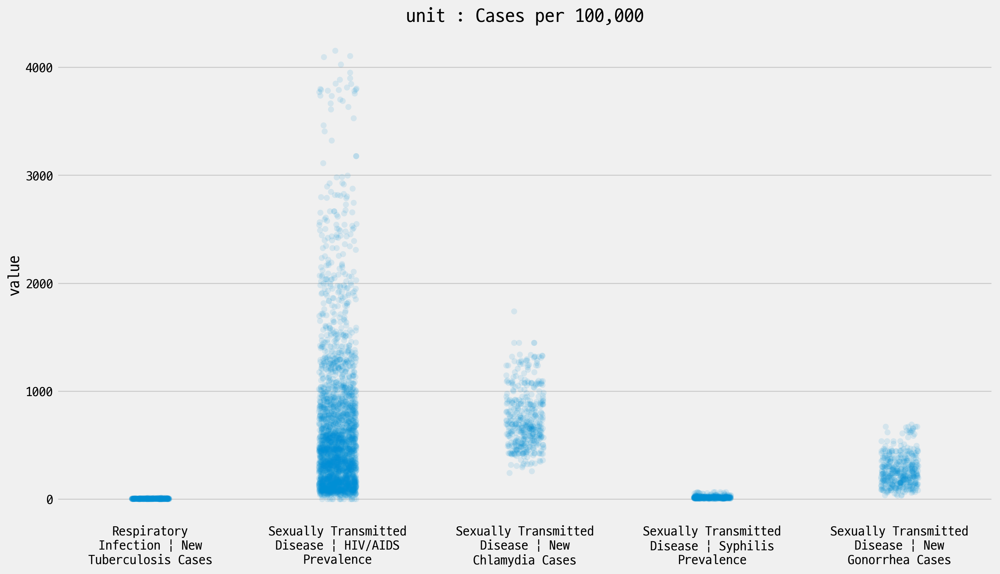

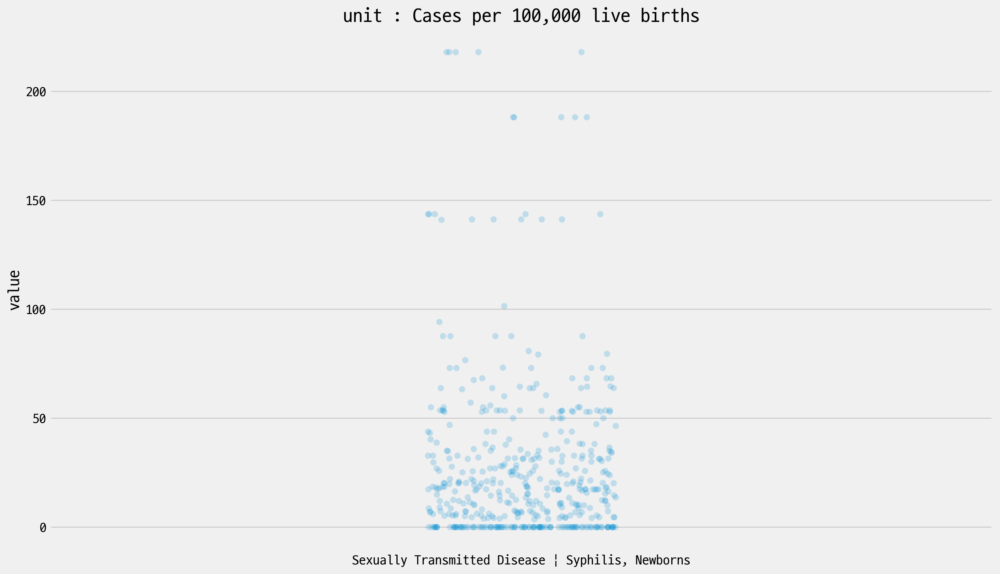

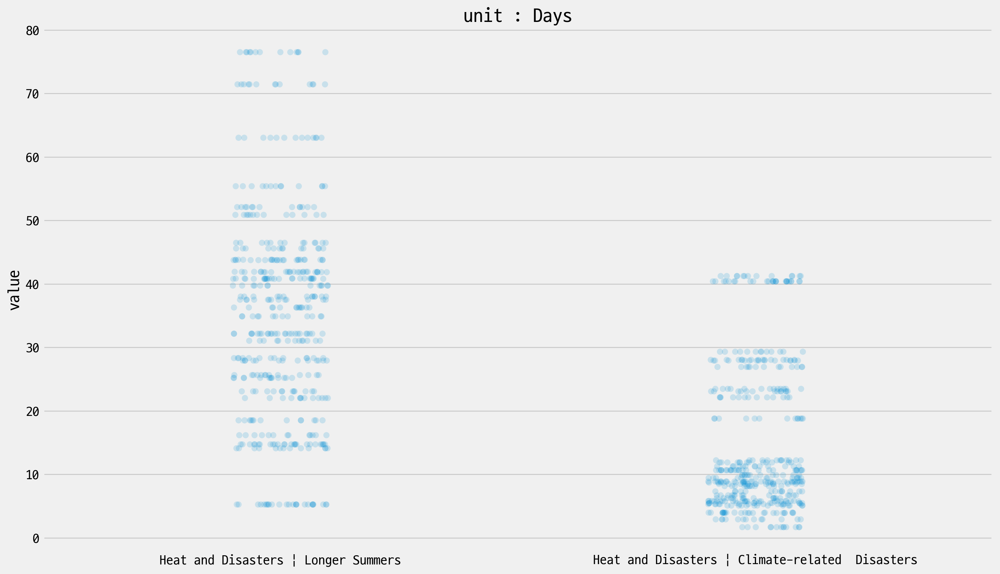

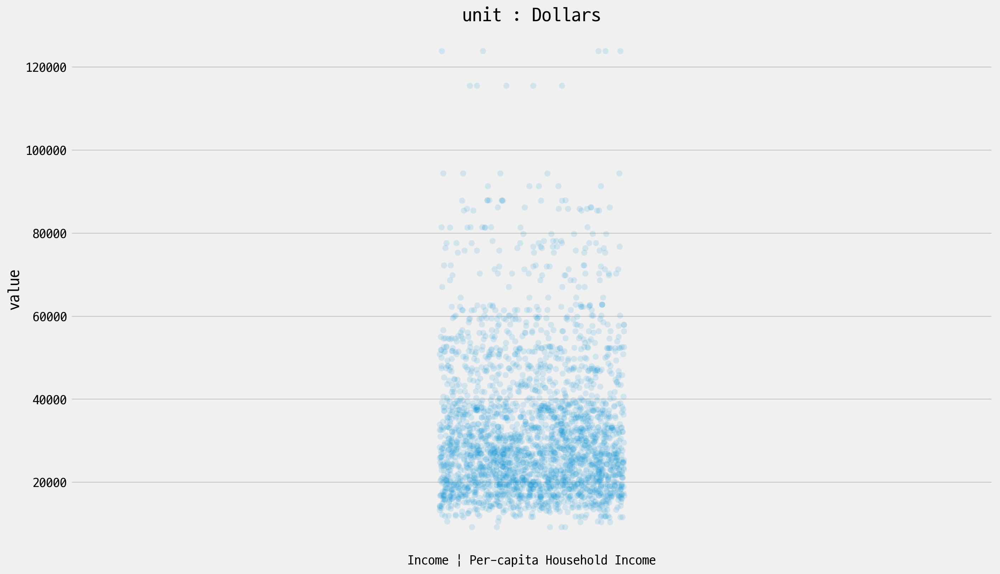

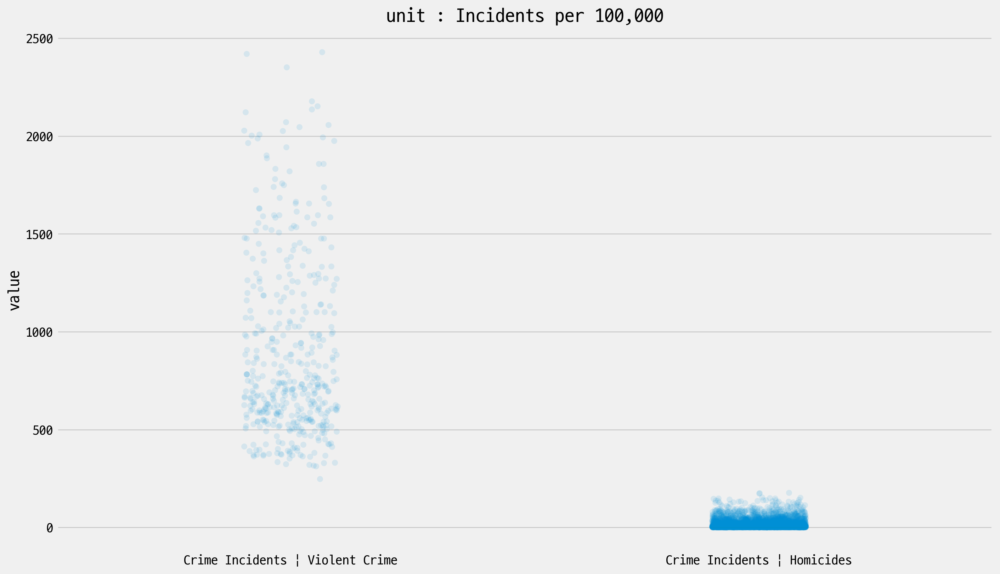

...

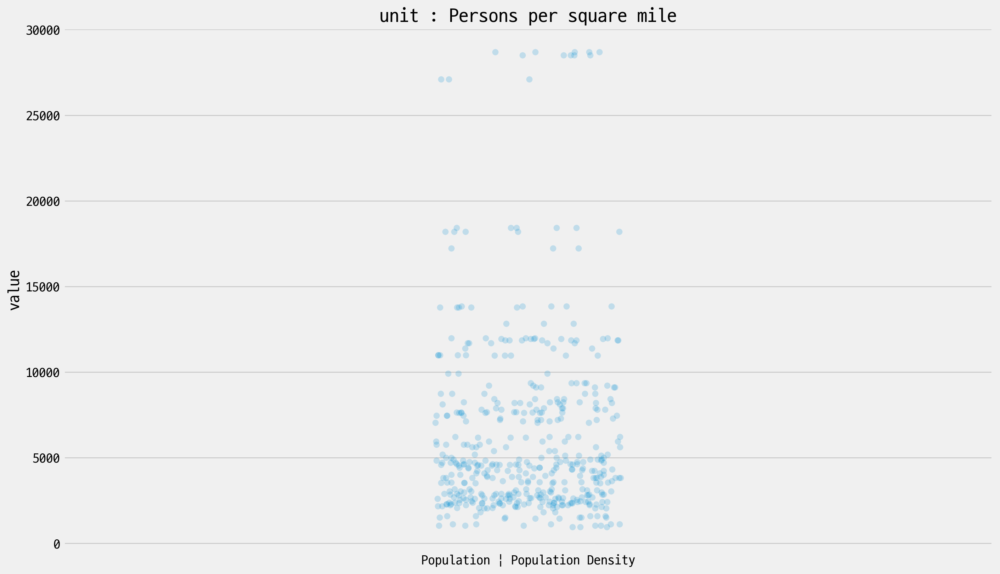

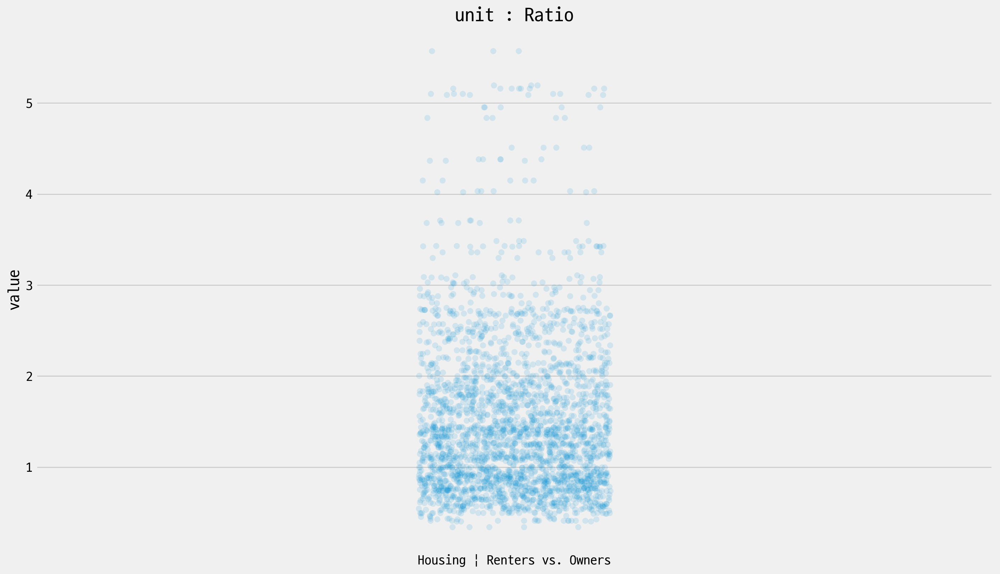

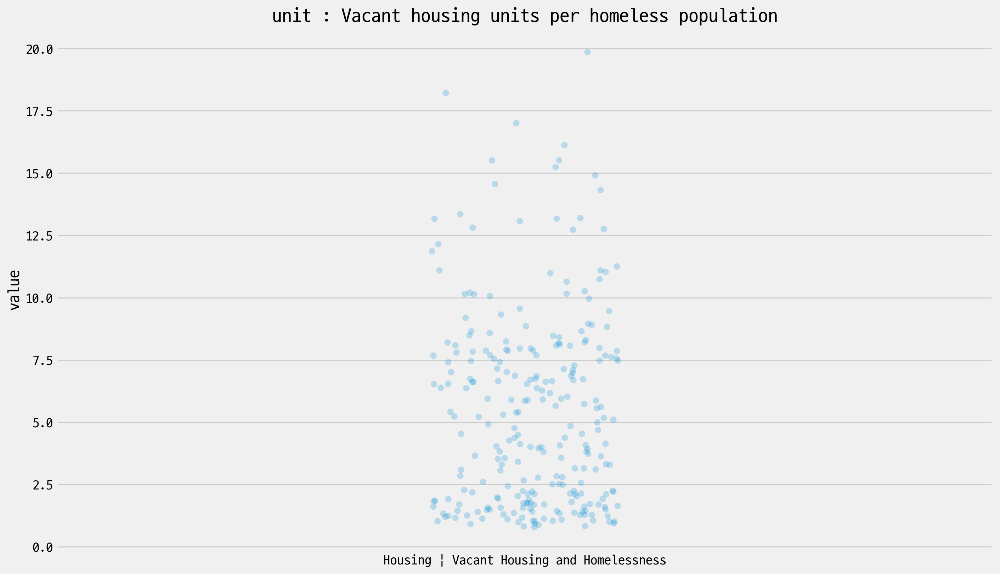

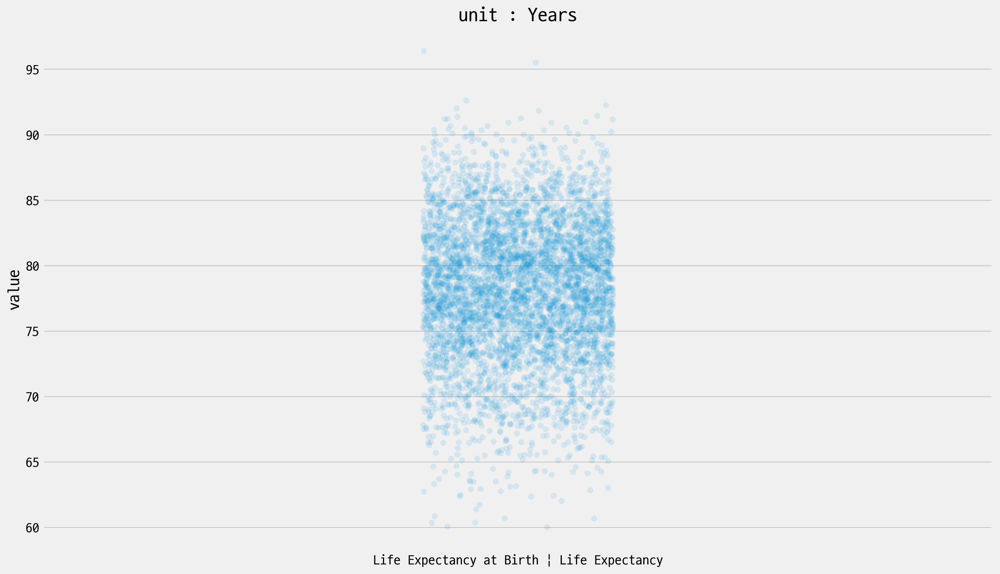

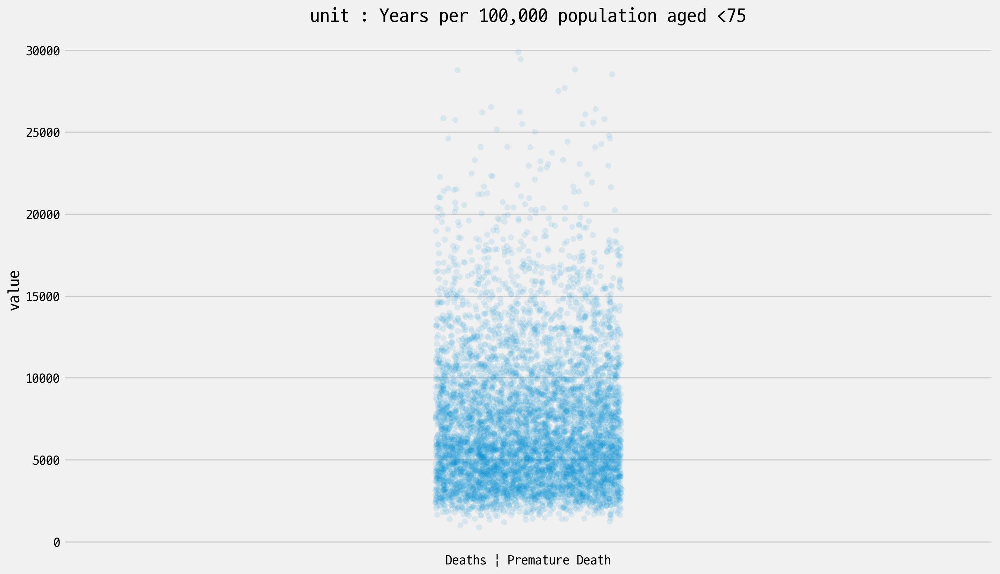

In [54]:
def division_point(a,b,ratio):
    return (ratio * a + b)/(1+ratio)

for unit in grouped_by_unit.index:
    fig,ax = plt.subplots(figsize=(14,8))
    group = list(grouped_by_unit[unit])
    data_label = df_city.loc[df_city['metric_label'].isin(group),['metric_label','value']]
    sns.stripplot(data=data_label,
                  x='metric_label',
                  y='value', s=division_point(6,15,np.sqrt(len(data_label))),
#                  alpha=0.05,
                  alpha=10/(1+np.log(len(data_label)))**2,
                  ax=ax)
    if len(group) > 2 :
        old_label = list(map(lambda x : (x._text),ax.get_xticklabels()))
        ax.set_xticklabels(map(lambda x: str_cutter(x,22),old_label),ha = 'center')
    if len(group) > 7 : 
        new_label = list(map(lambda x : x.split(' | ')[-1],old_label))
        ax.set_xticklabels(new_label, ha = 'right', rotation = 90)
    if len(group) > 30:
        ax.set_xticklabels(new_label, ha = 'right', rotation = 90, fontsize = 8)
    ax.set_title(f'unit : {unit}')
    ax.set_xlabel('')
    pass

In [46]:
from sklearn.preprocessing import MinMaxScaler

minmax = MinMaxScaler()

df_list = [] 
for unit in grouped_by_unit.index:
    var_dict = dict()
    group = list(grouped_by_unit[unit])
    for label in group:
        values_label = df_city.loc[df_city['metric_label']==label,'value'].values
        values_label = values_label.reshape(-1,1)
        values_scaled = minmax.fit_transform(values_label)
        var_dict[label] = {
            'min_origin' : np.min(values_label),
            'max_origin' : np.max(values_label),
            'std_origin' : np.std(values_label,ddof=1),
            'std_scaled' : np.std(values_scaled,ddof=1)
        }
    print(unit)
    df_group = pd.DataFrame(var_dict).T.sort_values(by=['std_scaled'])
    display(df_group)
    df_group['unit'] = [unit] * len(df_group)
    df_list.append(df_group)

Cases per 100,000


,min_origin,max_origin,std_origin,std_scaled
Sexually Transmitted Disease | HIV/AIDS Prevalence,0.0,4155.2,633.265478,0.152403
Sexually Transmitted Disease | New Chlamydia Cases,241.2,1740.0,260.684038,0.173929
Sexually Transmitted Disease | Syphilis Prevalence,1.7,66.0,11.462105,0.178260
Respiratory Infection | New Tuberculosis Cases,0.9,14.0,2.350632,0.179438
Sexually Transmitted Disease | New Gonorrhea Cases,32.3,691.7,138.909308,0.210660


Cases per 100,000 live births


,max_origin,min_origin,std_origin,std_scaled
"Sexually Transmitted Disease | Syphilis, Newborns",218.1,0.0,38.808661,0.17794


Days


,min_origin,max_origin,std_origin,std_scaled
Heat and Disasters | Longer Summers,5.291667,76.55,16.636897,0.233473
Heat and Disasters | Climate-related Disasters,1.700000,41.25,11.224505,0.283805


Dollars


,max_origin,min_origin,std_origin,std_scaled
Income | Per-capita Household Income,123781.0,9215.0,16514.030906,0.144144


Incidents per 100,000


,min_origin,max_origin,std_origin,std_scaled
Crime Incidents | Homicides,0.390534,177.075431,21.847010,0.12365
Crime Incidents | Violent Crime,247.978421,2430.540585,450.960327,0.20662


Lower is better


,min_origin,max_origin,std_origin,std_scaled
"Racial Segregation Indices | Racial Segregation, White and Asian",24.235413,73.709643,8.337795,0.168528
Income Inequality | Household Income Inequality,-0.417027,0.535981,0.189200,0.198529
"Racial Segregation Indices | Racial Segregation, White and Non-White",23.080583,63.750438,9.299369,0.228655
"Racial Segregation Indices | Racial Segregation, White and Black",34.052616,82.995941,11.483776,0.234634
"Racial Segregation Indices | Racial Segregation, White and Hispanic",27.180399,65.623007,9.168969,0.238511
Income Inequality | Income Inequality,0.438500,0.549600,0.028288,0.254615


Number


,max_origin,min_origin,std_origin,std_scaled
Heat and Disasters | Number of Heat Waves,9.230769,2.615385,1.566329,0.236771


Per 1,000


,max_origin,min_origin,std_origin,std_scaled
Deaths | Infant Deaths,18.745802,1.212856,3.167332,0.18065


Per 1,000 females aged 15-19


,max_origin,min_origin,std_origin,std_scaled
Births | Teen Births,108.797573,0.479482,20.540804,0.189634


Per 1,000,000


,min_origin,max_origin,std_origin,std_scaled
Deaths | Police Killings,0.124048,10.598666,1.946342,0.185815
Deaths | Racial Disparity in Police Killings,-0.755277,10.257729,2.547810,0.231346


Per 100,000


,min_origin,max_origin,std_origin,std_scaled
Substance Use | Drug Overdose Deaths,1.021154,361.132863,29.248669,0.081221
Substance Use | Opioid Overdose Deaths,0.378272,283.676957,25.519061,0.090078
Deaths | Injury Deaths,8.544513,566.412211,56.429955,0.101153
Deaths | Motor Vehicle Deaths,1.146940,74.370839,7.428255,0.101446
Sexually Transmitted Disease | HIV-Related Deaths,0.291317,48.710788,5.551657,0.114658
Deaths | Gun Deaths (Firearms),0.244125,188.381426,22.067076,0.117292
Cancer | Colorectal Cancer Deaths,4.758794,44.120084,5.162161,0.131148
Respiratory Infection | COVID-19 Deaths,10.214955,550.262320,71.698438,0.132763
Mental Health | Suicide,1.197470,62.080139,8.246733,0.135453
Cancer | All Cancer Deaths,38.478528,366.096025,49.763327,0.151895


Per 100,000 females


,max_origin,min_origin,std_origin,std_scaled
Cancer | Breast Cancer Deaths,47.144915,6.063927,7.109412,0.173058


Per 100,000 males


,max_origin,min_origin,std_origin,std_scaled
Cancer | Prostate Cancer Deaths,135.501279,5.467552,13.048362,0.100346


Percent


,min_origin,max_origin,std_origin,std_scaled
"Health Insurance | Uninsured, Child",0.000000,53.080569,5.308348,0.100005
Mental Health | Electronic Bullying,5.000000,30.800000,3.030748,0.117471
Mental Health | School Bullying,6.500000,33.800000,3.230483,0.118333
Air Pollution | Hazardous Air Quality,0.000000,61.643836,8.062406,0.130790
Disability | People with Disabilities,2.973169,39.174268,4.877715,0.134739
...,...,...,...,...
Food Access | Limited Supermarket Access,2.567482,73.280664,18.160412,0.256818
Language and Nativity | Foreign Born Population,4.599319,41.006077,9.372114,0.257428
"Respiratory Infection | COVID-19 Vaccination, Adults",62.200000,95.000000,8.737136,0.266376
Transportation | Longer Driving Commute Time,22.413465,60.816557,10.353660,0.269605


Persons per square mile


,max_origin,min_origin,std_origin,std_scaled
Population | Population Density,28697.81109,957.810839,5365.875376,0.193435


Ratio


,max_origin,min_origin,std_origin,std_scaled
Housing | Renters vs. Owners,5.570248,0.342834,0.840836,0.160851


Vacant housing units per homeless population


,max_origin,min_origin,std_origin,std_scaled
Housing | Vacant Housing and Homelessness,19.87,0.792206,3.915454,0.205236


Years


,max_origin,min_origin,std_origin,std_scaled
Life Expectancy at Birth | Life Expectancy,96.381181,60.02972,5.240285,0.144156


Years per 100,000 population aged <75


,max_origin,min_origin,std_origin,std_scaled
Deaths | Premature Death,29892.77192,874.249356,4083.740837,0.140729


In [47]:
# 참고

for n in [100,200,500,1000,3000,6000]:
    sample = np.linspace(0,1,n,endpoint=True)
    print(n," : ",np.std(sample,ddof=1))

100  :  0.29304537349375775
200  :  0.2908501734369403
500  :  0.2895427510380739
1000  :  0.28910854464038976
3000  :  0.2888195162806301
6000  :  0.28874731440616946


<Axes: >

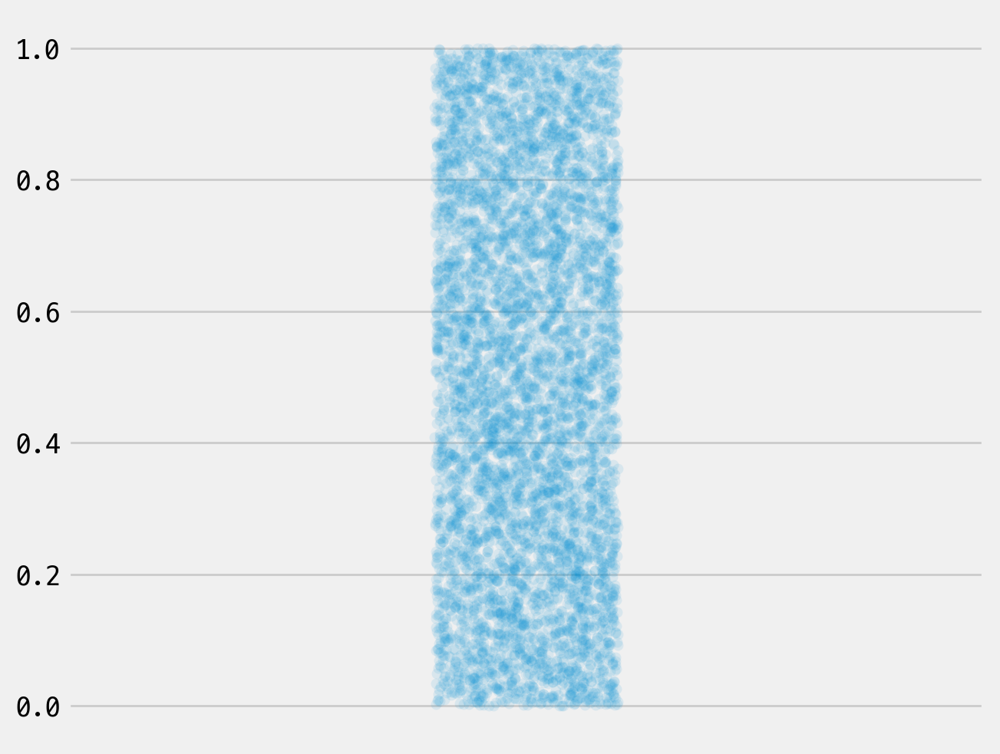

In [48]:
fig,ax=plt.subplots()
sns.stripplot(data=sample,ax=ax,alpha=7.5/np.sqrt(6000),jitter=True)

In [49]:
df_label_desc = pd.concat(df_list)
df_label_desc

,min_origin,max_origin,std_origin,std_scaled,unit
Sexually Transmitted Disease | HIV/AIDS Prevalence,0.000000,4155.200000,633.265478,0.152403,"Cases per 100,000"
Sexually Transmitted Disease | New Chlamydia Cases,241.200000,1740.000000,260.684038,0.173929,"Cases per 100,000"
Sexually Transmitted Disease | Syphilis Prevalence,1.700000,66.000000,11.462105,0.178260,"Cases per 100,000"
Respiratory Infection | New Tuberculosis Cases,0.900000,14.000000,2.350632,0.179438,"Cases per 100,000"
Sexually Transmitted Disease | New Gonorrhea Cases,32.300000,691.700000,138.909308,0.210660,"Cases per 100,000"
...,...,...,...,...,...
Population | Population Density,957.810839,28697.811090,5365.875376,0.193435,Persons per square mile
Housing | Renters vs. Owners,0.342834,5.570248,0.840836,0.160851,Ratio
Housing | Vacant Housing and Homelessness,0.792206,19.870000,3.915454,0.205236,Vacant housing units per homeless population
Life Expectancy at Birth | Life Expectancy,60.029720,96.381181,5.240285,0.144156,Years


In [50]:
target_cand=[
                          'Deaths | Premature Death',
                            'Deaths | Injury Deaths',
                   'Deaths | Deaths from All Causes',
                        'Cancer | All Cancer Deaths',
 'Cardiovascular Disease | Cardiovascular Diseas...',
     'Cardiovascular Disease | Heart Disease Deaths',
            'Diabetes and Obesity | Diabetes Deaths',
                       'Cancer | Lung Cancer Deaths',
              'Substance Use | Drug Overdose Deaths',
                           'Mental Health | Suicide',
                     'Deaths | Motor Vehicle Deaths',
]

In [51]:
df_label_desc[df_label_desc.index.isin(target_cand)]

,min_origin,max_origin,std_origin,std_scaled,unit
Substance Use | Drug Overdose Deaths,1.021154,361.132863,29.248669,0.081221,"Per 100,000"
Deaths | Injury Deaths,8.544513,566.412211,56.429955,0.101153,"Per 100,000"
Deaths | Motor Vehicle Deaths,1.146940,74.370839,7.428255,0.101446,"Per 100,000"
Mental Health | Suicide,1.197470,62.080139,8.246733,0.135453,"Per 100,000"
Cancer | All Cancer Deaths,38.478528,366.096025,49.763327,0.151895,"Per 100,000"
Deaths | Deaths from All Causes,164.618082,1906.888878,275.254166,0.157986,"Per 100,000"
Cardiovascular Disease | Heart Disease Deaths,33.238320,498.128161,74.174567,0.159553,"Per 100,000"
Cancer | Lung Cancer Deaths,7.228669,106.001104,16.393928,0.165977,"Per 100,000"
Diabetes and Obesity | Diabetes Deaths,3.415029,82.846570,13.406133,0.168776,"Per 100,000"
Deaths | Premature Death,874.249356,29892.771920,4083.740837,0.140729,"Years per 100,000 population aged <75"
